In [2]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
from wordcloud import WordCloud

In [3]:
estadao = "base_aplicacao_resultado/rotulado_tratado_links_estadao_resgatados.csv"
folha_1 = "base_aplicacao_resultado/rotulado_tratado_links_folha_e_agora_sem_rotulos_resgatados.csv"
folha_2 = "base_aplicacao_resultado/rotulado_tratado_links_folha_e_agora_sem_rotulos_resgatar_novamente_resgatados.csv"
correio = "base_aplicacao_resultado/rotulado_tratado_links_correio_do_povo_organizado_paragrafos_resgatados.csv"

In [4]:
df = pd.read_csv(estadao)
df.shape

(2398, 7)

In [5]:
df["metaforico"] = df["metaforico_pred"].apply(lambda x: "sim" if x == 1 else 'nao')

In [6]:
df.metaforico.value_counts(normalize = True)

nao    0.568807
sim    0.431193
Name: metaforico, dtype: float64

In [7]:
grp = df.groupby(["ano", "metaforico"], as_index = False).size()
grp_ano = df.groupby(["ano"], as_index = False).size().rename(columns = {"size": "qtd_ano"})
grp1 = grp.merge(grp_ano, on = "ano", how = "left")
grp1["percentual"] = (grp1["size"] / grp1["qtd_ano"]) * 100

grp_prop = grp.pivot_table(index = ["ano"], columns = ["metaforico"], values = ["size"]).reset_index()
grp_prop.columns = ["ano", "nao", "sim"]
grp_prop["proporcao"] = grp_prop["sim"] / grp_prop["nao"]

grp2 = grp1.merge(grp_prop[["ano","proporcao"]], on = "ano", how = "left")

grp2.head()

,ano,metaforico,size,qtd_ano,percentual,proporcao
0,2001,nao,6,16,37.500000,1.666667
1,2001,sim,10,16,62.500000,1.666667
2,2002,nao,18,39,46.153846,1.166667
3,2002,sim,21,39,53.846154,1.166667
4,2003,nao,6,11,54.545455,0.833333


# Gráficos em Linhas

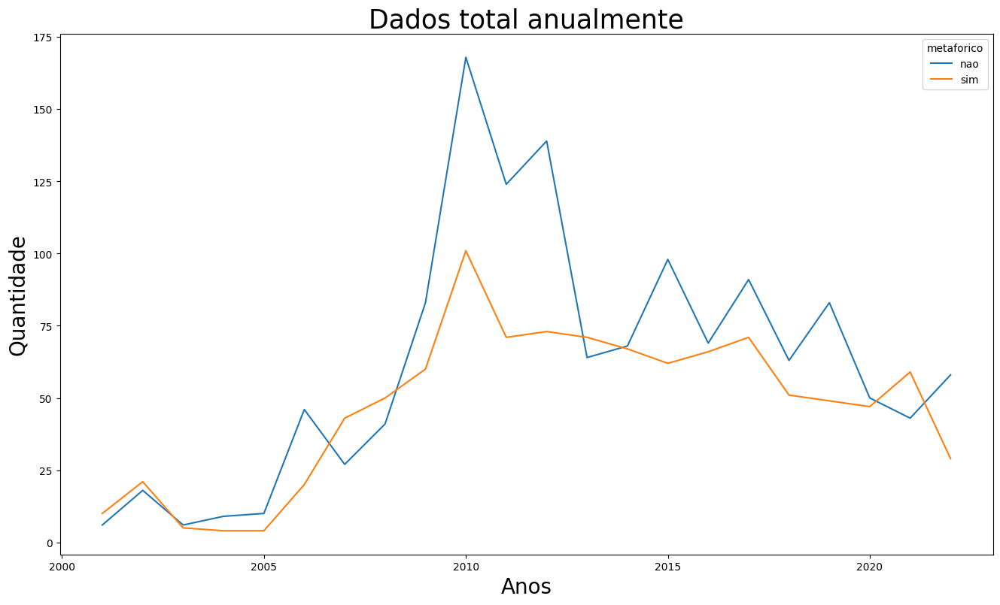

In [8]:
plt.figure(figsize = (16, 9))
ax = sns.lineplot(x = "ano", y = "size", data = grp2, hue = "metaforico")
ax.set_title("Dados total anualmente", fontsize = 25)
ax.set_xlabel("Anos", fontsize = 20)
ax.set_ylabel("Quantidade", fontsize = 20)
ax = ax

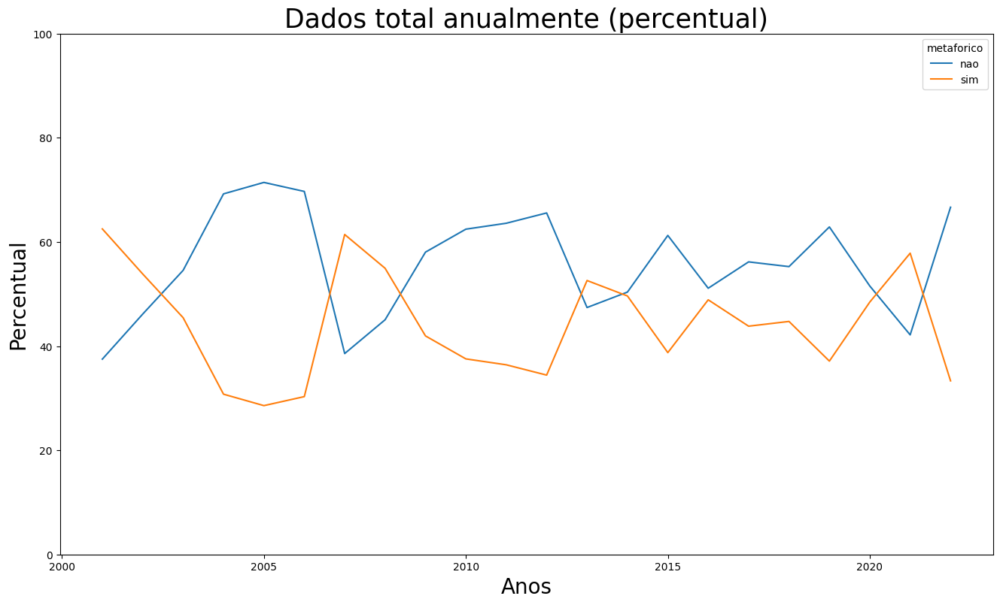

In [9]:
plt.figure(figsize = (16, 9))
ax = sns.lineplot(x = "ano", y = "percentual", data = grp2, hue = "metaforico")
ax.set_title("Dados total anualmente (percentual)", fontsize = 25)
ax.set_xlabel("Anos", fontsize = 20)
ax.set_ylabel("Percentual", fontsize = 20)
ax.set_ylim(0, 100)
ax = ax

# Gráficos em barras

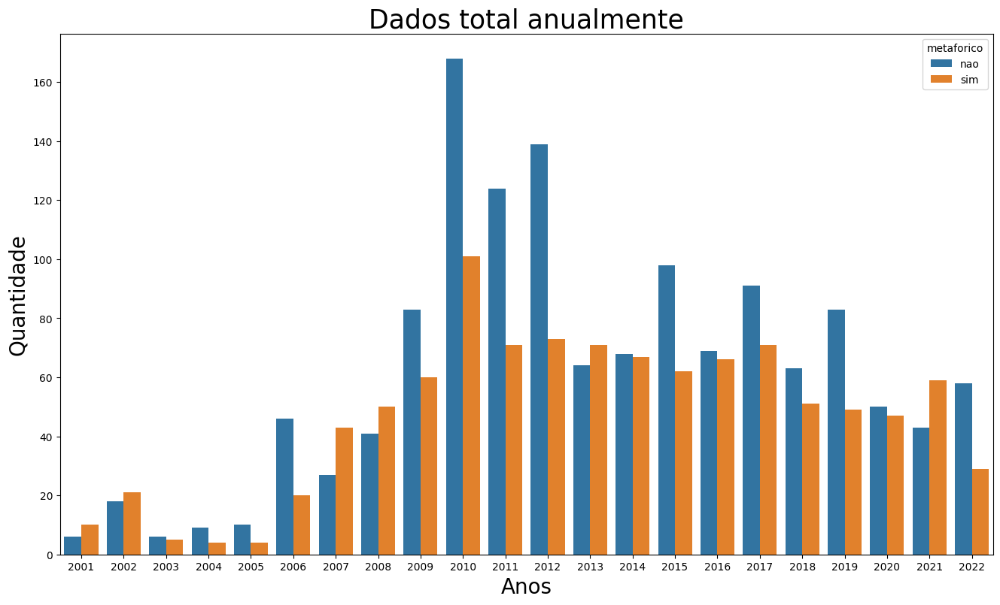

In [10]:
plt.figure(figsize= (16, 9))
ax = sns.barplot(x = "ano", y = "size", hue = "metaforico", data = grp2)
ax.set_title("Dados total anualmente", fontsize = 25)
ax.set_xlabel("Anos", fontsize = 20)
ax.set_ylabel("Quantidade", fontsize = 20)
ax = ax

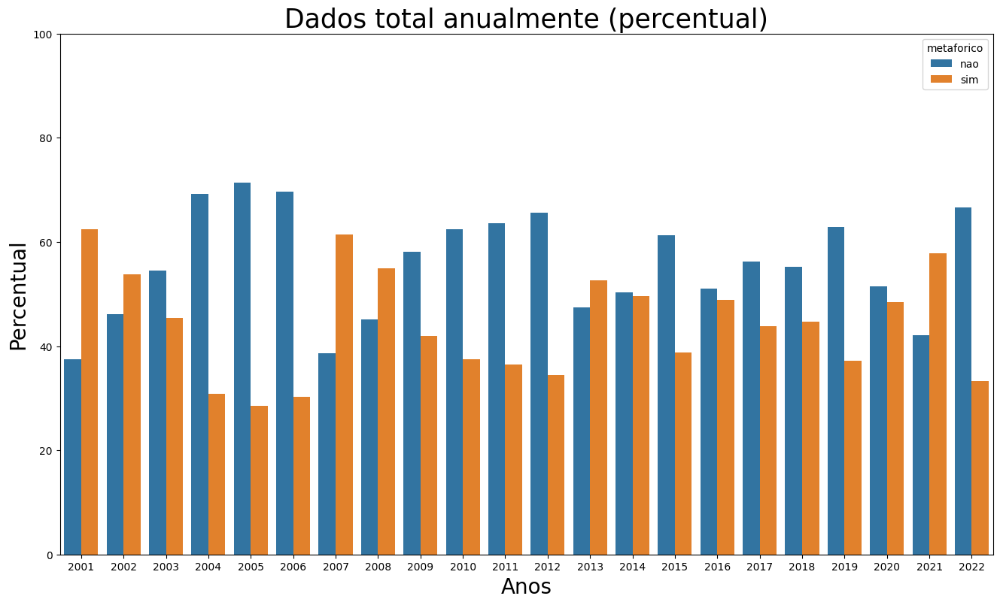

In [11]:
plt.figure(figsize = (16, 9))
ax = sns.barplot(x = "ano", y = "percentual", data = grp2, hue = "metaforico")
ax.set_title("Dados total anualmente (percentual)", fontsize = 25)
ax.set_xlabel("Anos", fontsize = 20)
ax.set_ylabel("Percentual", fontsize = 20)
ax.set_ylim(0, 100)
ax = ax

# Nuvens de palavras completas 

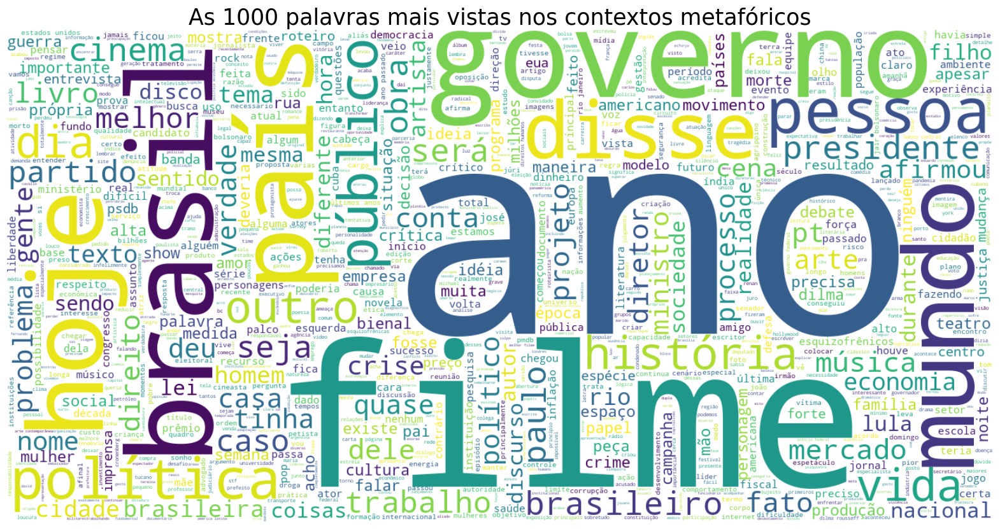

In [12]:
wc = WordCloud(background_color='white', max_words=1000, width=1400, height=700)

bloco = ' '.join(df.query("metaforico == 'sim'").paragrafos_tratados_sw) # Passar o bloco é padrão
lista = bloco.split(" ") # assim posso remover algumas palavras

palavras_removidas = ["esquizofrênico", "esquizofrênica", "esquizofrenico","esquizofrenica", "há", "esquizofrenia"]

lista_sem_especificas = [palavra for palavra in lista if palavra not in palavras_removidas]
bloco_sem_especificas = " ".join(lista_sem_especificas)

wc.generate(bloco_sem_especificas)
# wc.generate(bloco)
plt.figure(figsize=(20,20))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.title("As 1000 palavras mais vistas nos contextos metafóricos", fontsize = 25)
plt.show()

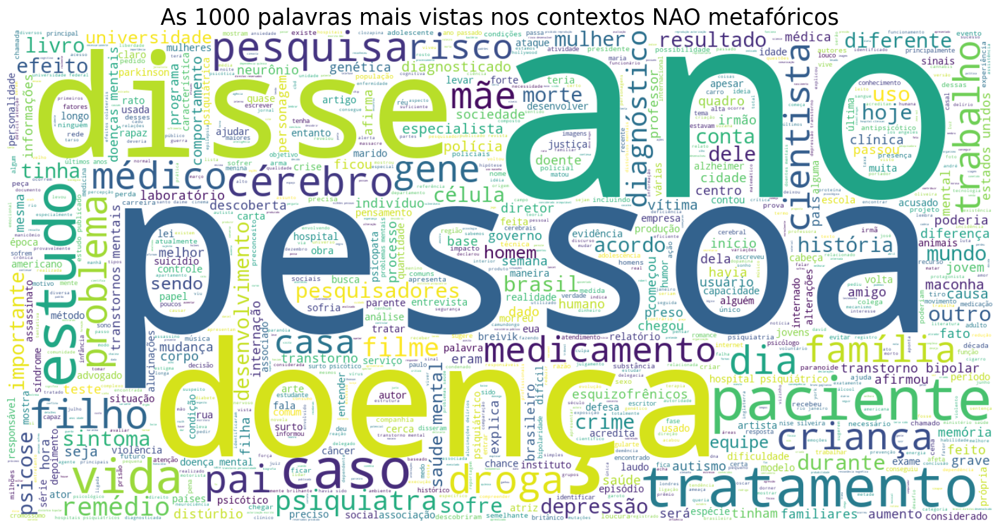

In [13]:
wc = WordCloud(background_color='white', max_words=1000, width=1400, height=700)

bloco = ' '.join(df.query("metaforico == 'nao'").paragrafos_tratados_sw) # Passar o bloco é padrão
lista = bloco.split(" ") # assim posso remover algumas palavras

palavras_removidas = ["esquizofrênico", "esquizofrênica", "esquizofrenico","esquizofrenica", "há", "esquizofrenia"]

lista_sem_especificas = [palavra for palavra in lista if palavra not in palavras_removidas]
bloco_sem_especificas = " ".join(lista_sem_especificas)

wc.generate(bloco_sem_especificas)
# wc.generate(bloco)
plt.figure(figsize=(20,20))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.title("As 1000 palavras mais vistas nos contextos NAO metafóricos", fontsize = 25)
plt.show()

# Nuvens de palavras por ano

In [14]:
def nuvem_palavras(ano, num):
    bloco = ' '.join(df.query(f"ano == {ano} and metaforico == '{num}'").paragrafos_tratados_sw) # Passar o bloco é padrão
    lista = ' '.join(df.query(f"ano == {ano} and metaforico == '{num}'").paragrafos_tratados_sw).split(" ") # assim posso remover algumas palavras
    
    palavras_removidas = ["esquizofrênico", "esquizofrênica", "esquizofrenico","esquizofrenica", "há", "esquizofrenia"]
    
    lista_sem_especificas = [palavra for palavra in lista if palavra not in palavras_removidas]
    bloco_sem_especificas = " ".join(lista_sem_especificas)
    
    wc.generate(bloco_sem_especificas)
    # wc.generate(bloco)
    plt.figure(figsize=(20,20))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    if num == 'nao':
        plt.title(f"{ano} | As 1000 palavras mais vistas nos contextos CLASSIFICADO COMO NAO metafóricos ({ano})", fontsize = 25)
        plt.show()
    else: 
        plt.title(f"{ano} | As 1000 palavras mais vistas nos contextos CLASSIFICADO COMO metafóricos ({ano})", fontsize = 25)
        plt.show()

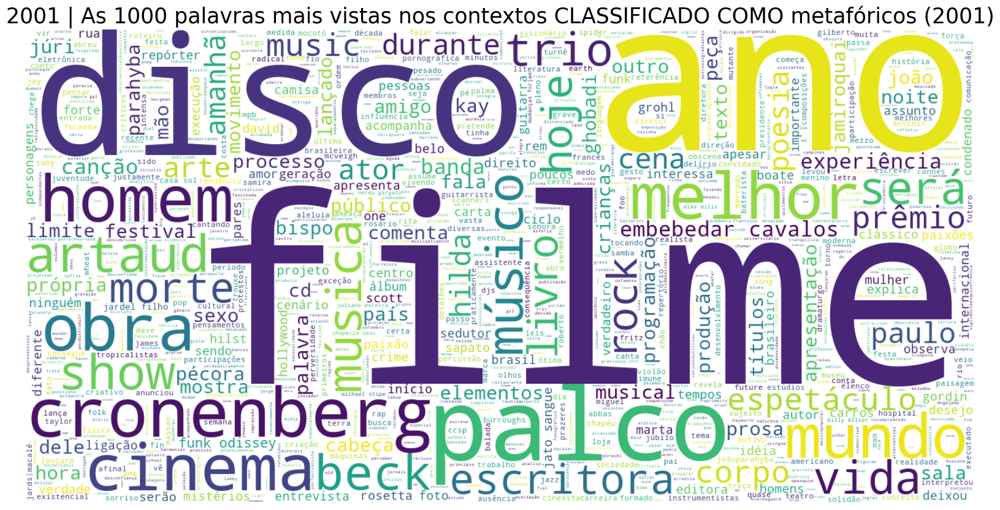

In [15]:
nuvem_palavras("2001", "sim")

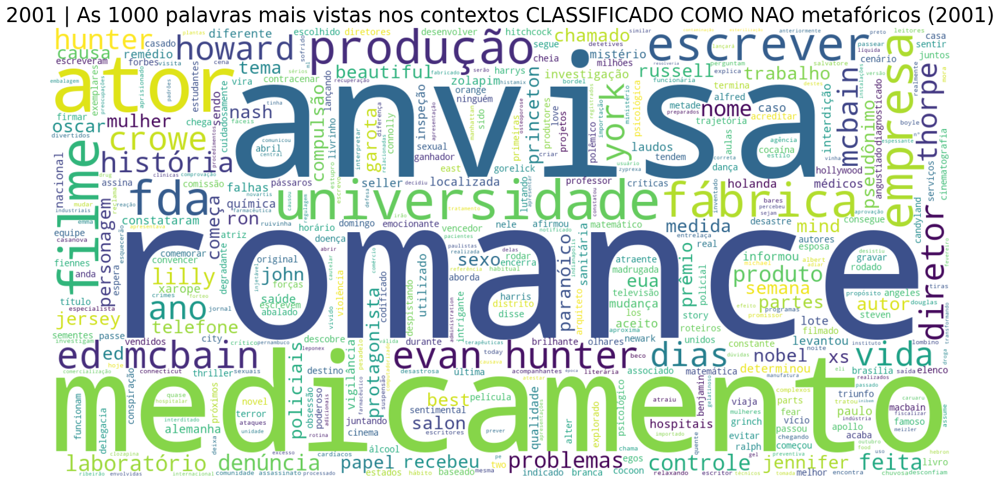

In [16]:
nuvem_palavras("2001", "nao")

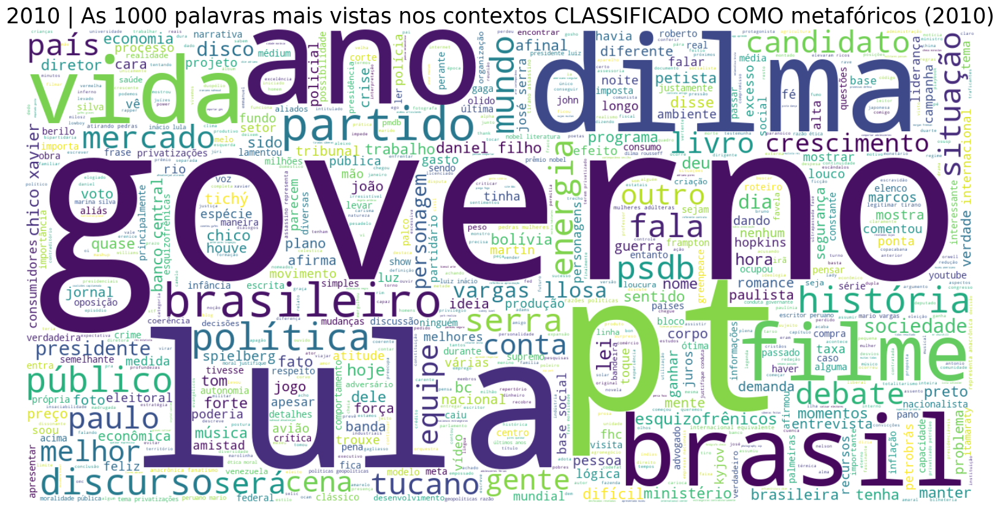

In [17]:
nuvem_palavras("2010", "sim")

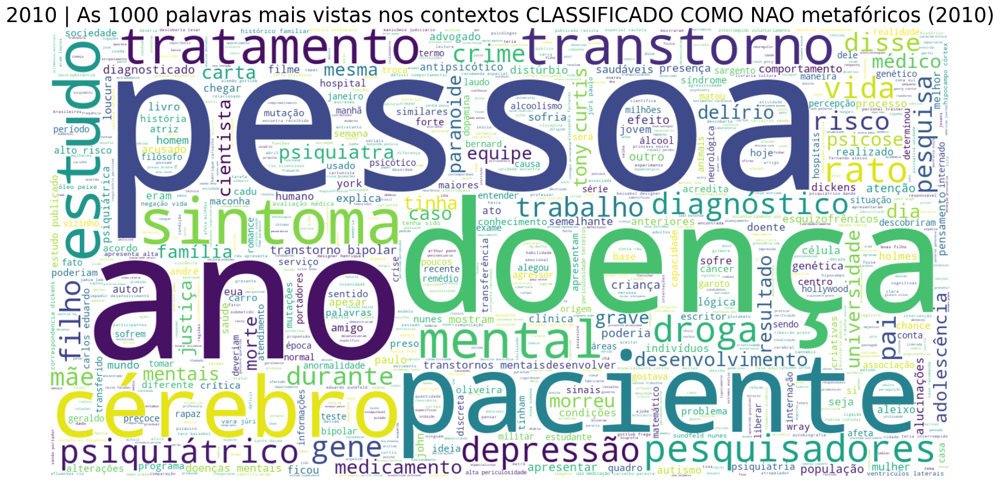

In [18]:
nuvem_palavras("2010", "nao")

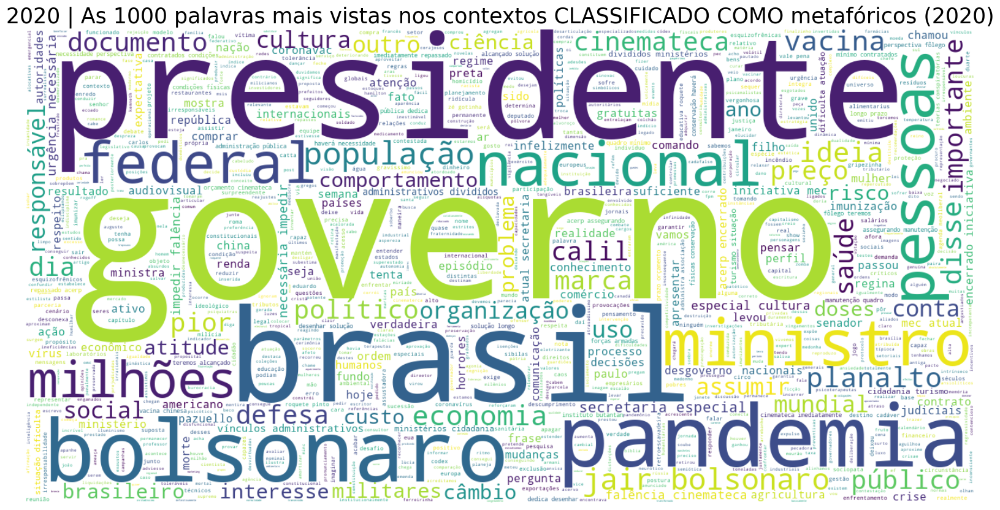

In [19]:
nuvem_palavras("2020", "sim")

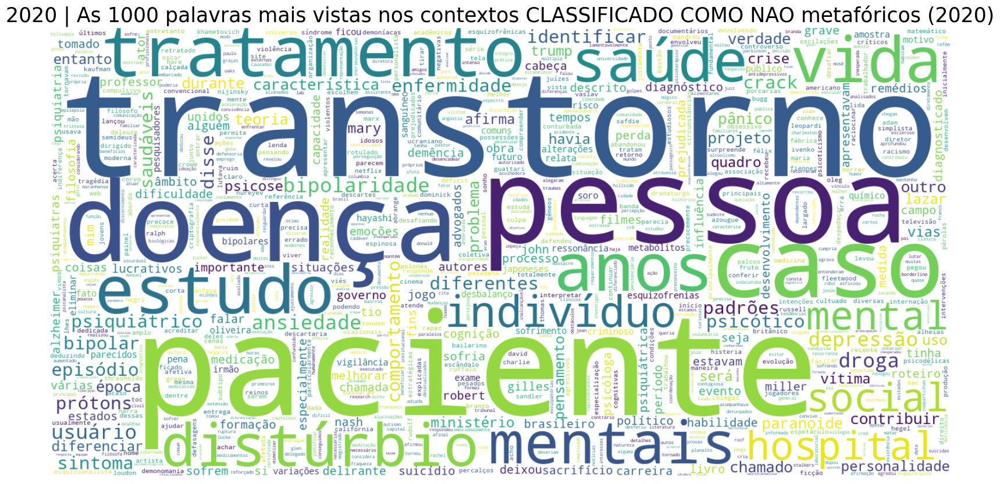

In [20]:
nuvem_palavras("2020", "nao")

In [21]:
!jupyter nbconvert --to html --no-input analise_estadao.ipynb

[NbConvertApp] Converting notebook analise_estadao.ipynb to html
[NbConvertApp] Writing 13750341 bytes to analise_estadao.html


In [33]:
palavras = pd.DataFrame({"palavras": " ".join(df.query("ano == 2001").paragrafos_tratados_sw.values.tolist()).split()})

In [35]:
palavras["palavras"].value_counts(dropna = False)

filme          15
anos           13
cronenberg     11
melhor         11
cinema         10
               ..
trabalha        1
lamenta         1
tecnológico     1
discussão       1
ue              1
Name: palavras, Length: 2209, dtype: int64

In [47]:
df.query("ano == 2001")[df.paragrafos_tratados_sw.str.contains("filme")]["paragrafos_tratados_sw"].apply(lambda x: x.split(" ").count("filme"))

c:\Users\r-omd\.conda\envs\tf-venv\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


5     4
6     7
7     0
8     2
9     1
10    1
Name: paragrafos_tratados_sw, dtype: int64

In [50]:
df.query("ano == 2001")[df.paragrafos_tratados_sw.str.contains("filme")].iloc[1].links

c:\Users\r-omd\.conda\envs\tf-venv\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


'https://cultura.estadao.com.br/noticias/cinema,estreia-tempo-de-embebedar-cavalos,20010510p1974'

In [40]:
df.ano.value_counts()

2010    269
2012    212
2011    195
2017    162
2015    160
2009    143
2016    135
2013    135
2014    135
2019    132
2018    114
2021    102
2020     97
2008     91
2022     87
2007     70
2006     66
2002     39
2001     16
2005     14
2004     13
2003     11
Name: ano, dtype: int64

In [42]:
df.query("ano == 2001")

,Unnamed: 0,ano,links,paragrafos_resgatados,paragrafos_tratados_sw,paragrafos_tratados_sw_vetorizados,metaforico_pred,metaforico
0,0,2001,https://cultura.estadao.com.br/noticias/musica...,"['Coqueluche entre os tropicalistas, o guitarr...",coqueluche tropicalistas guitarrista lanny gor...,[[ 8.02389502e+00 -5.07309303e+00 5.14662601e...,1,sim
1,1,2001,"https://cultura.estadao.com.br/noticias/geral,...",['Seu olhar acaricia os visitantes sempre rece...,olhar acaricia visitantes recebidos sorriso la...,[[ 2.61865890e+01 -1.48054691e+00 7.39961171e...,1,sim
2,2,2001,https://cultura.estadao.com.br/noticias/musica...,"['O samba-rock de Fritz Escovão, JoãoParahyba ...",fritz escovão joãoparahyba nereu gargalo trio ...,[[ 17.31581585 -8.47946408 16.02620509 10.1...,1,sim
3,3,2001,"https://cultura.estadao.com.br/noticias/geral,...",['O grande vencedor do 8º Festival Nordestino ...,vencedor festival nordestino teatro realizado ...,[[ 4.67055700e+00 1.05178498e+00 3.96655797e...,1,sim
4,4,2001,https://cultura.estadao.com.br/noticias/musica...,['O nome do CD já diz tudo: A Funk Odissey (la...,nome cd funk odissey lançamento sony music far...,[[ 18.79145796 -8.50003004 10.14401409 6.1...,1,sim
5,5,2001,"https://cultura.estadao.com.br/noticias/geral,...","['David Cronenberg é tão simpático, afável e d...",david cronenberg simpático afável divertido te...,[[ 2.68721870e+01 -1.67454072e-01 1.84797001e...,1,sim
6,6,2001,https://cultura.estadao.com.br/noticias/cinema...,['Há o que se pode considerar uma nítida super...,há considerar nítida superioridade paisagem in...,[[ 9.59628990e+00 1.71742316e+00 8.84405377e...,1,sim
7,7,2001,"https://cultura.estadao.com.br/noticias/geral,...","['A partir de amanhã, a vasta programação do C...",amanhã vasta programação centro cultural paulo...,[[ 1.87576821e+01 -2.95001487e+00 9.71991707e...,1,sim
8,8,2001,https://cultura.estadao.com.br/noticias/cinema...,"['Russell Crowe, vencedor do Oscar 2001 de Mel...",russell crowe vencedor oscar melhor ator chega...,[[ 6.33455503e+00 1.37168107e+00 1.67691200e...,0,nao
9,9,2001,https://cultura.estadao.com.br/noticias/cinema...,['Russell Crowe começou a rodar um novo filme ...,russell crowe começou rodar filme diretor ron ...,[[ 2.49097299e+00 1.01547599e+00 -1.37792002e...,0,nao


In [60]:
df[df.paragrafos_tratados_sw.str.contains("filme")]["paragrafos_tratados_sw"].apply(lambda x: x.split(" ").count("filme")).sort_values().tail(10)

46       8
68       8
45       9
186      9
1150    11
42      12
62      12
19      13
382     14
181     24
Name: paragrafos_tratados_sw, dtype: int64

In [57]:
df[df.index == 181]["links"].values

array(['https://cultura.estadao.com.br/noticias/artes,as-palavras-que-escapam-da-tela,37062'],
      dtype=object)

In [58]:
df[df.paragrafos_tratados_sw.str.contains("filme")]

,Unnamed: 0,ano,links,paragrafos_resgatados,paragrafos_tratados_sw,paragrafos_tratados_sw_vetorizados,metaforico_pred,metaforico
5,5,2001,"https://cultura.estadao.com.br/noticias/geral,...","['David Cronenberg é tão simpático, afável e d...",david cronenberg simpático afável divertido te...,[[ 2.68721870e+01 -1.67454072e-01 1.84797001e...,1,sim
6,6,2001,https://cultura.estadao.com.br/noticias/cinema...,['Há o que se pode considerar uma nítida super...,há considerar nítida superioridade paisagem in...,[[ 9.59628990e+00 1.71742316e+00 8.84405377e...,1,sim
7,7,2001,"https://cultura.estadao.com.br/noticias/geral,...","['A partir de amanhã, a vasta programação do C...",amanhã vasta programação centro cultural paulo...,[[ 1.87576821e+01 -2.95001487e+00 9.71991707e...,1,sim
8,8,2001,https://cultura.estadao.com.br/noticias/cinema...,"['Russell Crowe, vencedor do Oscar 2001 de Mel...",russell crowe vencedor oscar melhor ator chega...,[[ 6.33455503e+00 1.37168107e+00 1.67691200e...,0,nao
9,9,2001,https://cultura.estadao.com.br/noticias/cinema...,['Russell Crowe começou a rodar um novo filme ...,russell crowe começou rodar filme diretor ron ...,[[ 2.49097299e+00 1.01547599e+00 -1.37792002e...,0,nao
...,...,...,...,...,...,...,...,...
2090,2090,2020,"https://cultura.estadao.com.br/noticias/geral,...",['Rudolf Khametovich Nureyev era um azougue. P...,rudolf khametovich nureyev azougue pegou bastã...,[[ 3.98278701e+00 2.68763996e-01 3.06801998e...,0,nao
2191,2191,2021,https://cultura.estadao.com.br/blogs/luiz-zani...,"['Vendo-se o filme, pode-se compreender esse s...",filme compreender silêncio pai materialista em...,[[ 4.31471096e+00 2.37044906e+00 1.87846200e...,0,nao
2194,2194,2021,https://cultura.estadao.com.br/noticias/cinema...,"[', por telefone. “Achei uma provocação maravi...",telefone achei provocação maravilhosa vejo fil...,[[ 1.64991302e+00 9.20002998e-01 -1.01137800e...,0,nao
2205,2205,2021,https://cultura.estadao.com.br/blogs/p-de-pop/...,['Iríamos fazer agora um filme de época grande...,iríamos filme época chama the worst man in lon...,[[ 3.54630307e+00 -3.22002801e+00 3.31484492e...,1,sim
